In [114]:
import pandas as pd
import numpy as np 
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns
import folium
sns.set()

## Setup

In [115]:
PATH = './data/cleaned_ufo_data/data_geocoded.csv'
# Read csv file into dataframe
df = pd.read_csv(PATH, header=0, names=[
                 'DateTime', 'City', 'State', 'Country', 'location', 'geocode','lat','long'])

In [116]:
df


,DateTime,City,State,Country,location,geocode,lat,long
0,2021-09-30 22:50:00,Ocala,FL,USA,"Ocala,FL,USA","(29.1871986, -82.14009229999999)",29.187199,-82.140092
1,2021-09-30 22:49:00,Atlanta,GA,USA,"Atlanta,GA,USA","(33.748752, -84.38768449999999)",33.748752,-84.387684
2,2021-09-30 21:45:00,Lakeland,GA,USA,"Lakeland,GA,USA","(31.0410373, -83.0751471)",31.041037,-83.075147
3,2021-09-30 21:25:00,Grand Haven,MI,USA,"Grand Haven,MI,USA","(43.0630734, -86.22838639999999)",43.063073,-86.228386
4,2021-09-30 20:59:00,Lewis Center,OH,USA,"Lewis Center,OH,USA","(40.1983884, -83.0100987)",40.198388,-83.010099
...,...,...,...,...,...,...,...,...
14283,2021-02-01 18:50:00,Frisco,TX,USA,"Frisco,TX,USA","(33.1506744, -96.82361159999999)",33.150674,-96.823612
14284,2021-02-01 17:02:00,Jonesboro,AR,USA,"Jonesboro,AR,USA","(35.835696, -90.7051346)",35.835696,-90.705135
14285,2021-02-01 15:36:00,Springfield,MO,USA,"Springfield,MO,USA","(37.2089572, -93.29229889999999)",37.208957,-93.292299
14286,2021-02-01 15:25:00,Elizabeth,CO,USA,"Elizabeth,CO,USA","(39.3602662, -104.596915)",39.360266,-104.596915


In [117]:
#get only column lat and long 
features = df[['lat','long']]
features

,lat,long
0,29.187199,-82.140092
1,33.748752,-84.387684
2,31.041037,-83.075147
3,43.063073,-86.228386
4,40.198388,-83.010099
...,...,...
14283,33.150674,-96.823612
14284,35.835696,-90.705135
14285,37.208957,-93.292299
14286,39.360266,-104.596915


## Elbow Test

This test is used to find the optimal number of clusters for the K-means cluster

In [118]:
num_clusters = range(1, 10)
kmeans_list = [KMeans(n_clusters=i, random_state=7, init ='k-means++') for i in num_clusters] # An list of kmeans clusters each with a different number of clusters

In [119]:
score = [kmeans_list[i].fit(features).score(features) for i in range(len(kmeans_list))] # A list of scores for each kmeans cluster

### Conclusion
Based on the Elbow test, we identified 4 as the optimal number of cluster. The reason is that as the number of clusters go beyond 4, there is no more substantial improvement on the score.

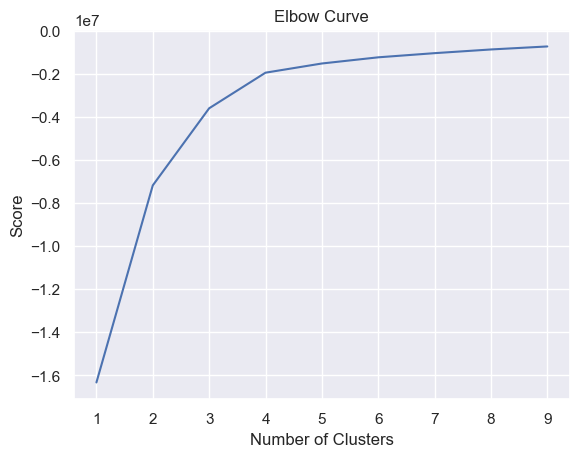

In [120]:
plt.plot(num_clusters, score)
plt.title('Elbow Curve')
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.show()

## K-means Cluster Training and Labelling

In [121]:
# create kmeans model/object 
kmeans = KMeans(
    init ='k-means++',
    n_clusters = 4,
    random_state = 7
)

In [122]:
# fit and predict the clusters
labels = kmeans.fit_predict(features)

In [123]:
# add a new cluster column
df['cluster'] = labels

In [124]:
# select only column lat, long, cluster 
df = df[['lat','long','cluster']]
df

,lat,long,cluster
0,29.187199,-82.140092,1
1,33.748752,-84.387684,1
2,31.041037,-83.075147,1
3,43.063073,-86.228386,1
4,40.198388,-83.010099,1
...,...,...,...
14283,33.150674,-96.823612,1
14284,35.835696,-90.705135,1
14285,37.208957,-93.292299,1
14286,39.360266,-104.596915,0


In [125]:
# display the number of member each clustering 
clusters = df.groupby('cluster')['lat'].count()
clusters

cluster
0    4556
1    9215
2     172
3     345
Name: lat, dtype: int64

In [126]:
colors = ['red', 'blue', 'green', 'purple']

In [127]:
map = folium.Map(location=[30, 31], zoom_start=2, min_zoom=1, max_zoom=14, tile='stamer terrain')

In [128]:
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["long"]],
        radius=5, 
        weight=2, 
        fill=True, 
        fill_color=colors[int(row["cluster"])],
        color=colors[int(row["cluster"])]
    ).add_to(map)

In [129]:
map

In [130]:
map.save('global_cluster.html')